In [1]:
%matplotlib inline

In [2]:
import functools

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import torchvision
import random
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

In [3]:
!nvidia-smi

Mon Dec 20 18:02:43 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 3090    On   | 00000000:1C:00.0 Off |                  N/A |
| 45%   43C    P2   141W / 350W |  13362MiB / 24268MiB |     38%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  GeForce RTX 3090    On   | 00000000:69:00.0 Off |                  N/A |
| 46%   

In [4]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'

In [5]:
class SkipConnection(nn.Module):
    def __init__(self, outer_nc, inner_nc, input_nc=None,submodule=None, outermost=False, innermost=False, 
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(SkipConnection, self).__init__()
        self.outermost = outermost
        if type(norm_layer) == functools.partial:
            use_bias = norm_layer.func == nn.InstanceNorm2d
        else:
            use_bias = norm_layer == nn.InstanceNorm2d
        if input_nc is None:
            input_nc = outer_nc
        downconv = nn.Conv2d(input_nc, inner_nc, kernel_size=4,
                             stride=2, padding=1, bias=use_bias)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = norm_layer(inner_nc)
        uprelu = nn.ReLU(True)
        upnorm = norm_layer(outer_nc)

        if outermost:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1)
            down = [downconv]
            if output_function == nn.Tanh:
                up = [uprelu, upconv, nn.Tanh()]
            else:
                up = [uprelu, upconv, nn.Sigmoid()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(inner_nc, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]

            if use_dropout:
                model = down + [submodule] + up + [nn.Dropout(0.5)]
            else:
                model = down + [submodule] + up

        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

In [6]:
class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, ngf=32,
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(Generator, self).__init__()
        # construct unet structure
        unet_block = SkipConnection(ngf * 8, ngf * 8, input_nc=None, submodule=None, norm_layer=norm_layer, innermost=True)
        unet_block = SkipConnection(ngf * 4, ngf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf * 2, ngf * 4, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf, ngf * 2, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(output_nc, ngf, input_nc=input_nc, submodule=unet_block, outermost=True, norm_layer=norm_layer, output_function=output_function)

        self.model = unet_block

    def forward(self, input):
        return self.model(input)

In [7]:
device = torch.device('cuda:0')

In [8]:
# Build ResNet 18 Module 

# https://github.com/kuangliu/pytorch-cifar

import torch
import torch.nn as nn
import torch.nn.functional as F


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, in_planes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, self.expansion *
                               planes, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion*planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512*block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        return out
    
def ResNet18():
    return ResNet(BasicBlock, [2, 2, 2, 2])

In [9]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [10]:
generator = Generator(input_nc=6, output_nc=3)
generator = generator.to(device)
generator.apply(weights_init)

classifier = ResNet18()
classifier = classifier.to(device)
classifier.apply(weights_init)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

In [11]:
def prepare_dataloader(num_workers=8,
                       train_batch_size=128,
                       eval_batch_size=256):

    train_transform = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
    ])

    test_transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    train_set = torchvision.datasets.CIFAR10(root="data",
                                             train=True,
                                             download=True,
                                             transform=train_transform)
    
    test_set = torchvision.datasets.CIFAR10(root="data",
                                            train=False,
                                            download=True,
                                            transform=test_transform)

    train_sampler = torch.utils.data.RandomSampler(train_set)
    test_sampler = torch.utils.data.SequentialSampler(test_set)

    train_loader = torch.utils.data.DataLoader(dataset=train_set,
                                               batch_size=train_batch_size,
                                               sampler=train_sampler,
                                               num_workers=num_workers)

    test_loader = torch.utils.data.DataLoader(dataset=test_set,
                                              batch_size=eval_batch_size,
                                              sampler=test_sampler,
                                              num_workers=num_workers)

    return train_loader, test_loader

In [12]:
train_loader, test_loader = prepare_dataloader()

Files already downloaded and verified
Files already downloaded and verified


In [13]:
# MSE loss
mse_criterion = nn.MSELoss()

ce_criterion = nn.CrossEntropyLoss()

In [14]:
# optimizerG = optim.Adam(generator.parameters(), lr=0.01, betas=(0.5, 0.999))

# optimizerC = optim.Adam(classifier.parameters(), lr=0.01, betas=(0.5, 0.999))

optimizer = optim.Adam(generator.parameters(), lr=0.01, betas=(0.5, 0.999))
optimizer.add_param_group({'params': classifier.parameters()})

In [15]:
class AverageMeter(object):
    """
    Computes and stores the average and current value.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [16]:
# transform = transforms.Normalize(mean=(0.485, 0.456, 0.406), 
#                              std=(0.229, 0.224, 0.225))

In [17]:
def show_images(images):
    grid_img = torchvision.utils.make_grid(images, nrow=3)
    plt.imshow(grid_img.permute(1,2,0))
    plt.show()

In [18]:
best_generator_loss = 1

In [19]:
best_classifier_loss = 1

In [20]:
# Training generator 

def train_generator(train_loader, epoch, generator, mse_criterion, cuda=True, show=True):
    generator.train()
    
    g_losses = AverageMeter()
    
    output_images = []

    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()

        # Select half dataset for container images
        pivot = len(image) // 2 
        container_image = image[0:pivot, :, :, :]
        real_image = image[pivot:pivot*2, :, :, :]
        real_label = label[pivot:pivot*2]

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, real_image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            real_image = real_image.to(device)
            real_label = real_label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        privacy_image = generator(gen_input_v)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])

        # Calculate loss 
        g_loss = mse_criterion(privacy_image, container_image_v)
        
        # Average loss 
        g_losses.update(g_loss.data, pivot)
        
        # Backward
        g_loss.backward()

        optimizerG.step()
    
    print('Training generator - Epoch {} g_loss = {}'.format(epoch, g_losses.avg))
    # Show some output images
    if show:
        show_images(output_images)

In [21]:
# Training classifier 

def train_classifier(train_loader, epoch, generator, classifier, ce_criterion, cuda=True, show=True):
    generator.eval()
    classifier.train()

    c_losses = AverageMeter() 
    
    correct = 0
    total = 0

    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()
        classifier.zero_grad()
        
        # Select half dataset for container images
        pivot = len(image) 
        container_image = torch.zeros(image.shape)

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            image = image.to(device)
            label = label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        with torch.no_grad():
            privacy_image = generator(gen_input_v)
        print(privacy_image)
        print(privacy_image)
        pred_label = classifier(privacy_image)
        pred_label = pred_label.to(device)

        # Calculate loss 
        c_loss = ce_criterion(pred_label, label)
        
        # Average loss 
        c_losses.update(c_loss.data, pivot)
        
        # Backward
        c_loss.backward()

        optimizerC.step()
        
        # Calculate accuracy
        _, predicted = pred_label.max(1)
        total += label.size(0)
        correct += predicted.eq(label).sum().item()
    
    print('Training classifier - Epoch {} c_loss = {} acc = {}'.format(epoch, c_losses.avg, correct/total))

In [22]:
def test_generator(test_loader, generator, mse_criterion, cuda=True, show=True):    
    global best_generator_loss
    
    generator.eval()
    
    g_losses = AverageMeter() 
    
    output_images = []
    
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) // 2 
            container_image = image[0:pivot, :, :, :]
            real_image = image[pivot:pivot*2, :, :, :]
            real_label = label[pivot:pivot*2]

            gen_input = torch.cat([container_image, real_image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                real_image = real_image.to(device)
                real_label = real_label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            
            if i % 100 == 0 and show:
                index = random.randint(0, pivot - 1)
                output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])
            
            # Calculate loss 
            g_loss = mse_criterion(privacy_image, container_image_v)

            # Average loss 
            g_losses.update(g_loss.data, pivot)
    
    
    print('Testing generator - g_loss = {}'.format(g_losses.avg))    
    
    # Save checkpoint 
    if g_losses.avg < best_generator_loss:
        best_generator_loss = g_losses.avg
        torch.save(generator.state_dict(), 'checkpoints/my_best_generator_loss.pth')
        print('Save best checkpoint with loss {}'.format(g_losses.avg))
    # Show some output images
    if show:
        show_images(output_images)        

In [23]:
def test_classifier(test_loader, generator, classifier, ce_criterion, cuda=True, show=True):
    global best_classifier_loss
    generator.eval()
    classifier.eval()
 
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) 
            
            container_image = torch.zeros(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                label = label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            print('container shape: ', container_image.shape)
            print('original image shape: ', image.shape)
            print('privacy shape: ', privacy_image.shape)
            import pdb; pdb.set_trace()
            pred_label = classifier(privacy_image)
            
            # Calculate loss 
            c_loss = ce_criterion(pred_label, label)

            # Average loss 
            c_losses.update(c_loss.data, pivot)

            # Calculate accuracy
            _, predicted = pred_label.max(1)
            total += label.size(0)
            correct += predicted.eq(label).sum().item()
    
    print('Testing classifier - Epoch {} c_loss = {} acc = {}'.format(epoch, c_losses.avg, correct/total))         
    # Save checkpoint 
    if c_losses.avg < best_classifier_loss:
        best_classifier_loss = c_losses.avg
        torch.save(classifier.state_dict(), 'checkpoints/my_best_classifier_loss.pth')
        print('Save best checkpoint with loss {}'.format(c_losses.avg))

In [24]:
# Training generator first
# for epoch in range(100):
#     show = False
#     if epoch % 20 == 0:
#         show = True
#     train_generator(train_loader, epoch, generator, mse_criterion, show=show)
#     test_generator(test_loader, generator, mse_criterion, show=show)

In [25]:
# generator.load_state_dict(torch.load('checkpoints/best_generator_loss.pth'))

In [26]:
# test_generator(test_loader, generator, mse_criterion, show=True)

In [27]:
# for epoch in range(100):
#     train_classifier(train_loader, epoch, generator, classifier, ce_criterion, cuda=True, show=True)
#     test_classifier(test_loader, generator, classifier, ce_criterion, cuda=True, show=True)

In [28]:
def train_end2end(train_loader, epoch, generator, classifier, mse_criterion, ce_criterion, cuda=True, show=True):
    generator.train()
    classifier.train()
    
    overall_losses = AverageMeter()
    g_losses = AverageMeter()
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    
    output_images = []
    print('Training - Epoch {}'.format(epoch))
    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()
        classifier.zero_grad()

        # Select half dataset for container images
        pivot = len(image) // 2 
        container_image = image[0:pivot, :, :, :]
        real_image = image[pivot:pivot*2, :, :, :]
        label = label[pivot:pivot*2]

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, real_image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            real_image = real_image.to(device)
            label = label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        privacy_image = generator(gen_input_v)
        pred = classifier(privacy_image)
        pred = pred.to(device)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])

        # Calculate loss 
        g_loss = mse_criterion(privacy_image, container_image_v)
        c_loss = ce_criterion(pred, label)
        overall_loss = g_loss + c_loss
        
        # Average loss 
        g_losses.update(g_loss.data, pivot)
        c_losses.update(c_loss.data, pivot)
        overall_losses.update(overall_loss.data, pivot)
        
        # Backward
        overall_loss.backward()

        optimizer.step()
        
        # Calculate accuracy
        _, predicted = pred.max(1)
        total += label.size(0)
        correct += predicted.eq(label).sum().item()
    print('overall - overall_loss = {}'.format(overall_losses.avg))
    print('generator - g_loss = {}'.format(g_losses.avg))
    print('classifier - c_loss = {} acc = {}'.format(c_losses.avg, correct/total))
    # Show some output images
    if show:
        show_images(output_images)

In [29]:
best_overall_loss = 100
def test_end2end(test_loader, generator, classifier, ce_criterion, cuda=True, show=True):
    global best_overall_loss
    generator.eval()
    classifier.eval()
 
    overall_losses = AverageMeter()
    g_losses = AverageMeter()
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    output_images = []
    print('Testing - Epoch {}'.format(epoch))
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            pivot = len(image)
            
            container_image = torch.zeros(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                label = label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            pred = classifier(privacy_image)
            
            if i % 100 == 0 and show:
                index = random.randint(0, pivot - 1)
                output_images.extend([container_image[index].cpu(), image[index].cpu(), privacy_image[index].cpu()])
            
            # Calculate loss 
            g_loss = mse_criterion(privacy_image, container_image_v)
            c_loss = ce_criterion(pred, label)
            overall_loss = g_loss + c_loss

            # Average loss 
            g_losses.update(g_loss.data, pivot)
            c_losses.update(c_loss.data, pivot)
            overall_losses.update(overall_loss.data, pivot)

            # Calculate accuracy
            _, predicted = pred.max(1)
            total += label.size(0)
            correct += predicted.eq(label).sum().item()
    
    print('overall - overall_loss = {}'.format(overall_losses.avg))
    print('generator - g_loss = {}'.format(g_losses.avg))
    print('classifier - c_loss = {} acc = {}'.format(c_losses.avg, correct/total))      
    # Save checkpoint 
    if overall_losses.avg < best_overall_loss:
        best_overall_loss = overall_losses.avg
        torch.save(generator.state_dict(), 'checkpoints/best_e2e_w55_generator_loss.pth')
        torch.save(classifier.state_dict(), 'checkpoints/best_e2e_w55_classifier_loss.pth')
        print('Save best checkpoint with overall loss {} - g_loss {} - c_loss {}'.format(overall_losses.avg, g_losses.avg, c_losses.avg))
    if show:
        show_images(output_images)

Training - Epoch 0
overall - overall_loss = 2.164797306060791
generator - g_loss = 0.061675604432821274
classifier - c_loss = 2.1031219959259033 acc = 0.22572


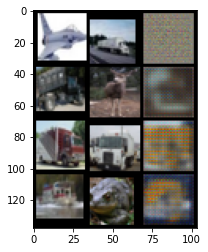

Testing - Epoch 0
overall - overall_loss = 2.9335122108459473
generator - g_loss = 0.07069972157478333
classifier - c_loss = 2.8628129959106445 acc = 0.1622
Save best checkpoint with overall loss 2.9335122108459473 - g_loss 0.07069972157478333 - c_loss 2.8628129959106445


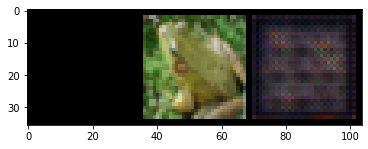

Training - Epoch 1
overall - overall_loss = 1.7852421998977661
generator - g_loss = 0.039383430033922195
classifier - c_loss = 1.7458575963974 acc = 0.34468


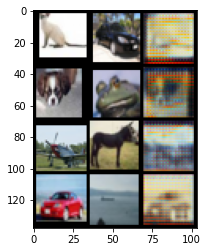

Testing - Epoch 1
overall - overall_loss = 1.665562629699707
generator - g_loss = 0.06117111071944237
classifier - c_loss = 1.6043915748596191 acc = 0.4127
Save best checkpoint with overall loss 1.665562629699707 - g_loss 0.06117111071944237 - c_loss 1.6043915748596191


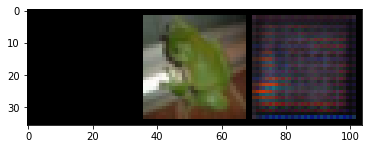

Training - Epoch 2
overall - overall_loss = 1.5604352951049805
generator - g_loss = 0.04092465341091156
classifier - c_loss = 1.5195107460021973 acc = 0.44084


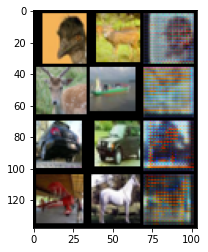

Testing - Epoch 2
overall - overall_loss = 1.899752140045166
generator - g_loss = 0.043417077511548996
classifier - c_loss = 1.856335163116455 acc = 0.3672


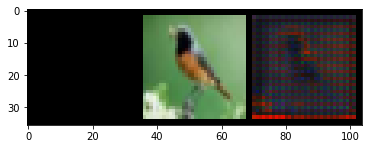

Training - Epoch 3
overall - overall_loss = 1.3451266288757324
generator - g_loss = 0.04148929566144943
classifier - c_loss = 1.3036378622055054 acc = 0.52984


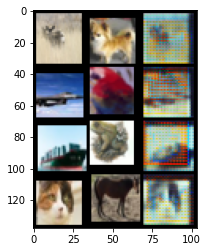

Testing - Epoch 3
overall - overall_loss = 1.3880397081375122
generator - g_loss = 0.044582292437553406
classifier - c_loss = 1.3434576988220215 acc = 0.5343
Save best checkpoint with overall loss 1.3880397081375122 - g_loss 0.044582292437553406 - c_loss 1.3434576988220215


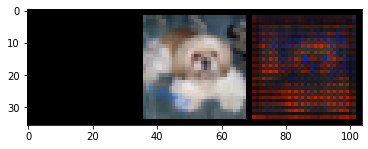

Training - Epoch 4
overall - overall_loss = 1.181820034980774
generator - g_loss = 0.04184246435761452
classifier - c_loss = 1.1399785280227661 acc = 0.59472


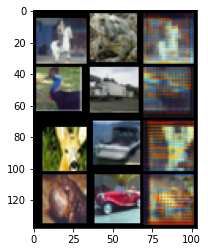

Testing - Epoch 4
overall - overall_loss = 1.207456350326538
generator - g_loss = 0.028317628428339958
classifier - c_loss = 1.1791387796401978 acc = 0.5816
Save best checkpoint with overall loss 1.207456350326538 - g_loss 0.028317628428339958 - c_loss 1.1791387796401978


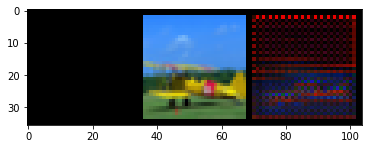

Training - Epoch 5
overall - overall_loss = 1.047775149345398
generator - g_loss = 0.04195612296462059
classifier - c_loss = 1.0058199167251587 acc = 0.64464


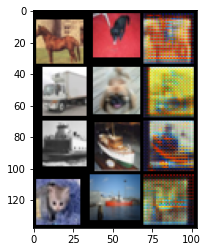

Testing - Epoch 5
overall - overall_loss = 1.0759127140045166
generator - g_loss = 0.04359077289700508
classifier - c_loss = 1.0323220491409302 acc = 0.639
Save best checkpoint with overall loss 1.0759127140045166 - g_loss 0.04359077289700508 - c_loss 1.0323220491409302


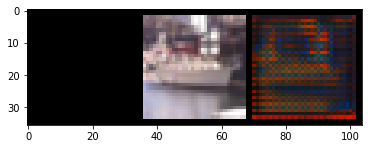

Training - Epoch 6
overall - overall_loss = 0.9374521374702454
generator - g_loss = 0.04058480262756348
classifier - c_loss = 0.8968674540519714 acc = 0.68504


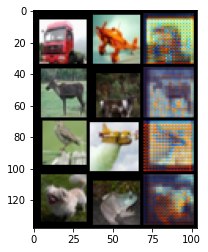

Testing - Epoch 6
overall - overall_loss = 1.4240646362304688
generator - g_loss = 0.036971572786569595
classifier - c_loss = 1.3870930671691895 acc = 0.5816


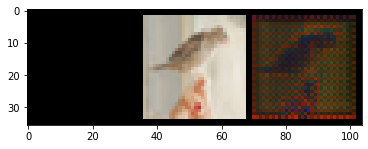

Training - Epoch 7
overall - overall_loss = 0.8577286601066589
generator - g_loss = 0.040398046374320984
classifier - c_loss = 0.8173308968544006 acc = 0.71604


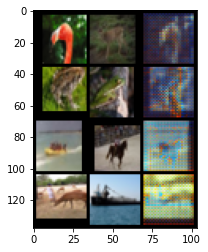

Testing - Epoch 7
overall - overall_loss = 0.9817036986351013
generator - g_loss = 0.046395231038331985
classifier - c_loss = 0.9353084564208984 acc = 0.6779
Save best checkpoint with overall loss 0.9817036986351013 - g_loss 0.046395231038331985 - c_loss 0.9353084564208984


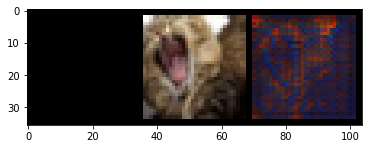

Training - Epoch 8
overall - overall_loss = 0.8019444346427917
generator - g_loss = 0.03920012339949608
classifier - c_loss = 0.762744665145874 acc = 0.73108


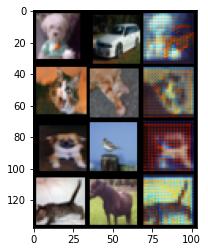

Testing - Epoch 8
overall - overall_loss = 0.9548052549362183
generator - g_loss = 0.044250838458538055
classifier - c_loss = 0.9105545878410339 acc = 0.6935
Save best checkpoint with overall loss 0.9548052549362183 - g_loss 0.044250838458538055 - c_loss 0.9105545878410339


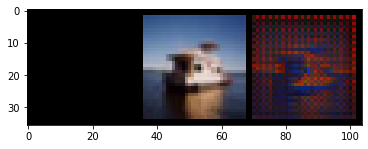

Training - Epoch 9
overall - overall_loss = 0.750933825969696
generator - g_loss = 0.03936697542667389
classifier - c_loss = 0.711567223072052 acc = 0.75008


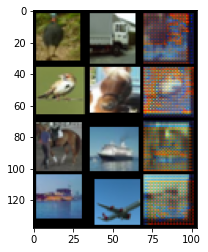

Testing - Epoch 9
overall - overall_loss = 0.913391649723053
generator - g_loss = 0.03631475940346718
classifier - c_loss = 0.8770768046379089 acc = 0.7029
Save best checkpoint with overall loss 0.913391649723053 - g_loss 0.03631475940346718 - c_loss 0.8770768046379089


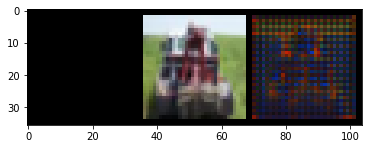

Training - Epoch 10
overall - overall_loss = 0.7268280386924744
generator - g_loss = 0.0392598994076252
classifier - c_loss = 0.6875681281089783 acc = 0.76164


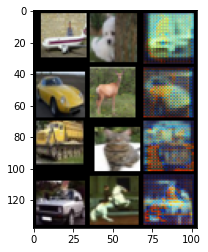

Testing - Epoch 10
overall - overall_loss = 0.7723842859268188
generator - g_loss = 0.04299826920032501
classifier - c_loss = 0.729386031627655 acc = 0.7446
Save best checkpoint with overall loss 0.7723842859268188 - g_loss 0.04299826920032501 - c_loss 0.729386031627655


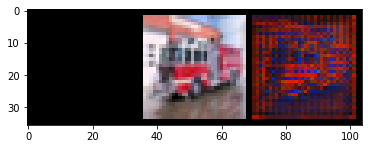

Training - Epoch 11
overall - overall_loss = 0.6964225769042969
generator - g_loss = 0.04071594774723053
classifier - c_loss = 0.6557067036628723 acc = 0.77092


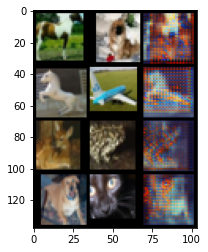

Testing - Epoch 11
overall - overall_loss = 0.7571685910224915
generator - g_loss = 0.04331011325120926
classifier - c_loss = 0.713858425617218 acc = 0.7565
Save best checkpoint with overall loss 0.7571685910224915 - g_loss 0.04331011325120926 - c_loss 0.713858425617218


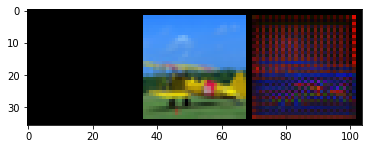

Training - Epoch 12
overall - overall_loss = 0.6553919911384583
generator - g_loss = 0.04107719659805298
classifier - c_loss = 0.6143149137496948 acc = 0.78732


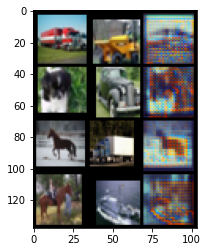

Testing - Epoch 12
overall - overall_loss = 1.067867398262024
generator - g_loss = 0.03886130079627037
classifier - c_loss = 1.029006004333496 acc = 0.6649


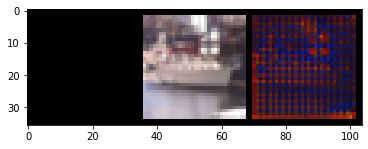

Training - Epoch 13
overall - overall_loss = 0.6335433125495911
generator - g_loss = 0.04073913022875786
classifier - c_loss = 0.5928042531013489 acc = 0.79404


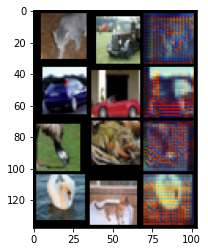

Testing - Epoch 13
overall - overall_loss = 0.7388970255851746
generator - g_loss = 0.05091838166117668
classifier - c_loss = 0.6879786252975464 acc = 0.7695
Save best checkpoint with overall loss 0.7388970255851746 - g_loss 0.05091838166117668 - c_loss 0.6879786252975464


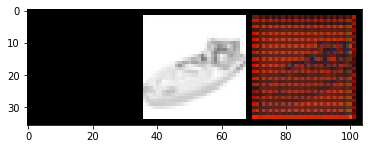

Training - Epoch 14
overall - overall_loss = 0.6071624159812927
generator - g_loss = 0.03966692462563515
classifier - c_loss = 0.5674957036972046 acc = 0.80364


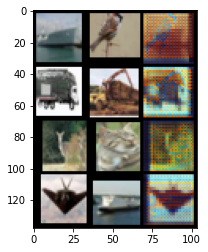

Testing - Epoch 14
overall - overall_loss = 0.6640993356704712
generator - g_loss = 0.03991878032684326
classifier - c_loss = 0.6241803765296936 acc = 0.7891
Save best checkpoint with overall loss 0.6640993356704712 - g_loss 0.03991878032684326 - c_loss 0.6241803765296936


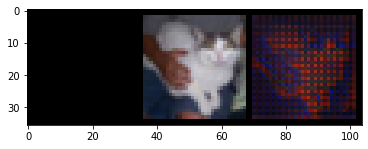

Training - Epoch 15
overall - overall_loss = 0.5802099704742432
generator - g_loss = 0.03960580751299858
classifier - c_loss = 0.5406039953231812 acc = 0.81064


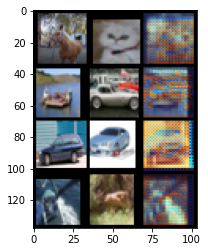

Testing - Epoch 15
overall - overall_loss = 1.2527300119400024
generator - g_loss = 0.06347522139549255
classifier - c_loss = 1.1892549991607666 acc = 0.6285


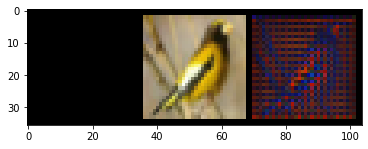

Training - Epoch 16
overall - overall_loss = 0.5613030195236206
generator - g_loss = 0.04003341495990753
classifier - c_loss = 0.5212700366973877 acc = 0.82136


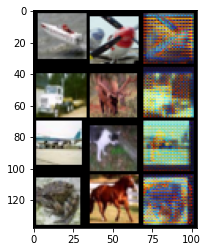

Testing - Epoch 16
overall - overall_loss = 0.8298460841178894
generator - g_loss = 0.0384463295340538
classifier - c_loss = 0.7913997173309326 acc = 0.7376


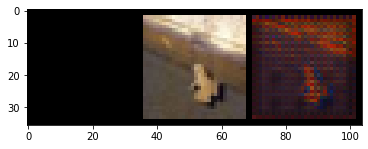

Training - Epoch 17
overall - overall_loss = 0.5394188761711121
generator - g_loss = 0.039597876369953156
classifier - c_loss = 0.4998213052749634 acc = 0.82616


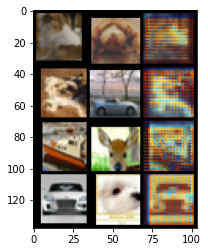

Testing - Epoch 17
overall - overall_loss = 0.6309263706207275
generator - g_loss = 0.04858158156275749
classifier - c_loss = 0.5823448300361633 acc = 0.8063
Save best checkpoint with overall loss 0.6309263706207275 - g_loss 0.04858158156275749 - c_loss 0.5823448300361633


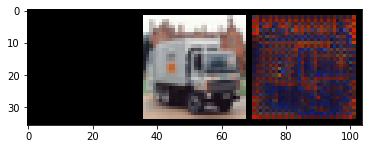

Training - Epoch 18
overall - overall_loss = 0.5176457166671753
generator - g_loss = 0.04008350893855095
classifier - c_loss = 0.4775618612766266 acc = 0.8344


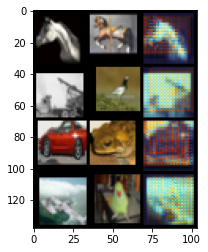

Testing - Epoch 18
overall - overall_loss = 0.602572500705719
generator - g_loss = 0.05063686892390251
classifier - c_loss = 0.5519355535507202 acc = 0.8138
Save best checkpoint with overall loss 0.602572500705719 - g_loss 0.05063686892390251 - c_loss 0.5519355535507202


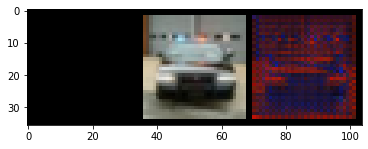

Training - Epoch 19
overall - overall_loss = 0.5020753145217896
generator - g_loss = 0.03925222158432007
classifier - c_loss = 0.46282315254211426 acc = 0.8394


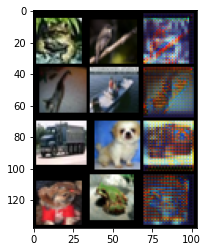

Testing - Epoch 19
overall - overall_loss = 0.5921362042427063
generator - g_loss = 0.027356743812561035
classifier - c_loss = 0.56477952003479 acc = 0.8104
Save best checkpoint with overall loss 0.5921362042427063 - g_loss 0.027356743812561035 - c_loss 0.56477952003479


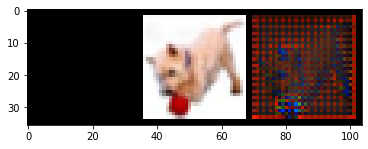

Training - Epoch 20
overall - overall_loss = 0.4984874725341797
generator - g_loss = 0.039015449583530426
classifier - c_loss = 0.45947229862213135 acc = 0.8394


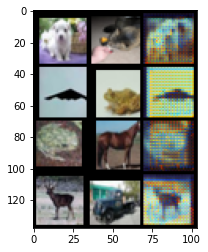

Testing - Epoch 20
overall - overall_loss = 0.6632298231124878
generator - g_loss = 0.05465632677078247
classifier - c_loss = 0.6085733771324158 acc = 0.8016


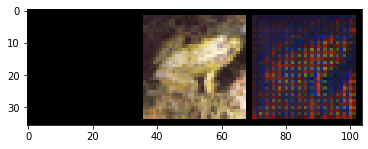

Training - Epoch 21
overall - overall_loss = 0.4761275351047516
generator - g_loss = 0.03831931948661804
classifier - c_loss = 0.4378083050251007 acc = 0.8496


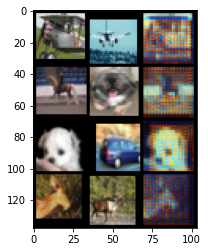

Testing - Epoch 21
overall - overall_loss = 0.5801544785499573
generator - g_loss = 0.03039362095296383
classifier - c_loss = 0.5497607588768005 acc = 0.8124
Save best checkpoint with overall loss 0.5801544785499573 - g_loss 0.03039362095296383 - c_loss 0.5497607588768005


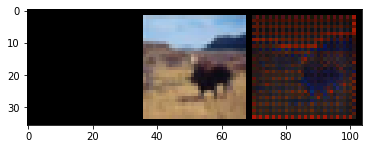

Training - Epoch 22
overall - overall_loss = 0.46900007128715515
generator - g_loss = 0.03948840871453285
classifier - c_loss = 0.4295113682746887 acc = 0.85376


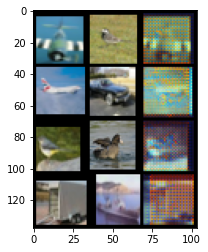

Testing - Epoch 22
overall - overall_loss = 0.6194332838058472
generator - g_loss = 0.04944802075624466
classifier - c_loss = 0.5699853897094727 acc = 0.8079


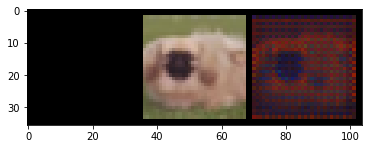

Training - Epoch 23
overall - overall_loss = 0.4582769274711609
generator - g_loss = 0.0389883816242218
classifier - c_loss = 0.41928866505622864 acc = 0.85448


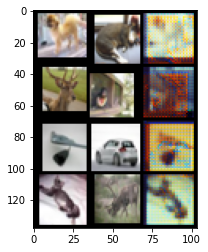

Testing - Epoch 23
overall - overall_loss = 0.6108984351158142
generator - g_loss = 0.027562927454710007
classifier - c_loss = 0.5833354592323303 acc = 0.8084


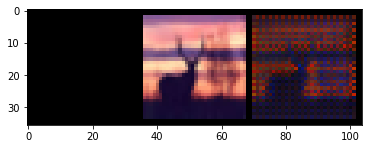

Training - Epoch 24
overall - overall_loss = 0.43256452679634094
generator - g_loss = 0.038886718451976776
classifier - c_loss = 0.39367765188217163 acc = 0.86124


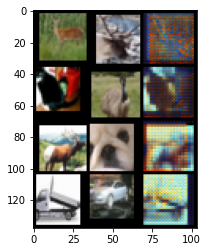

Testing - Epoch 24
overall - overall_loss = 0.6530870795249939
generator - g_loss = 0.03342992067337036
classifier - c_loss = 0.6196572780609131 acc = 0.7982


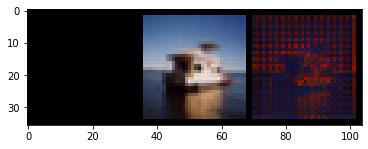

Training - Epoch 25
overall - overall_loss = 0.4186212420463562
generator - g_loss = 0.03862980008125305
classifier - c_loss = 0.3799913823604584 acc = 0.8672


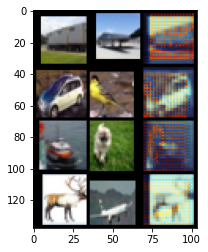

Testing - Epoch 25
overall - overall_loss = 0.5254696607589722
generator - g_loss = 0.04018547385931015
classifier - c_loss = 0.4852842688560486 acc = 0.8379
Save best checkpoint with overall loss 0.5254696607589722 - g_loss 0.04018547385931015 - c_loss 0.4852842688560486


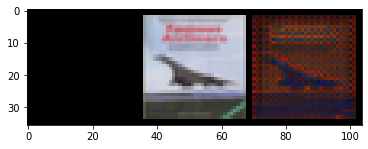

Training - Epoch 26
overall - overall_loss = 0.4151289761066437
generator - g_loss = 0.03847053274512291
classifier - c_loss = 0.37665855884552 acc = 0.86928


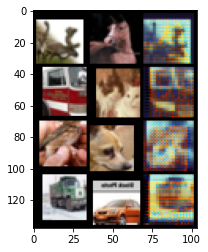

Testing - Epoch 26
overall - overall_loss = 0.579632043838501
generator - g_loss = 0.04129621386528015
classifier - c_loss = 0.5383357405662537 acc = 0.8194


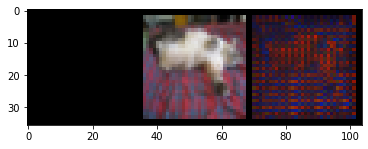

Training - Epoch 27
overall - overall_loss = 0.39869773387908936
generator - g_loss = 0.03791145235300064
classifier - c_loss = 0.36078619956970215 acc = 0.87404


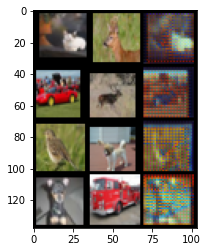

Testing - Epoch 27
overall - overall_loss = 0.5759367346763611
generator - g_loss = 0.024081138893961906
classifier - c_loss = 0.5518556237220764 acc = 0.8235


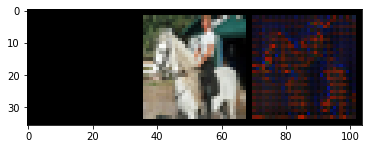

Training - Epoch 28
overall - overall_loss = 0.3893316686153412
generator - g_loss = 0.03888014331459999
classifier - c_loss = 0.3504517078399658 acc = 0.87896


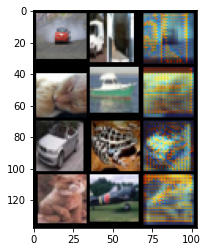

Testing - Epoch 28
overall - overall_loss = 0.543743371963501
generator - g_loss = 0.033033497631549835
classifier - c_loss = 0.510709822177887 acc = 0.8345


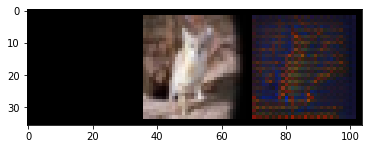

Training - Epoch 29
overall - overall_loss = 0.3827769160270691
generator - g_loss = 0.038285981863737106
classifier - c_loss = 0.34449121356010437 acc = 0.88112


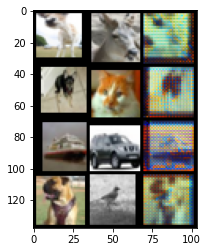

Testing - Epoch 29
overall - overall_loss = 0.5784775018692017
generator - g_loss = 0.02887885272502899
classifier - c_loss = 0.5495986342430115 acc = 0.8196


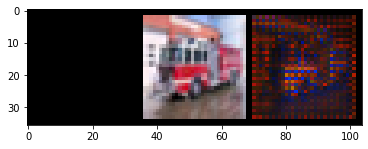

Training - Epoch 30
overall - overall_loss = 0.37412571907043457
generator - g_loss = 0.039200976490974426
classifier - c_loss = 0.33492472767829895 acc = 0.88544


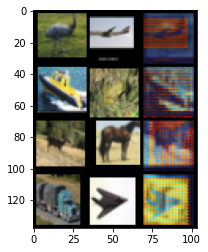

Testing - Epoch 30
overall - overall_loss = 0.48167601227760315
generator - g_loss = 0.03963935002684593
classifier - c_loss = 0.4420367181301117 acc = 0.8542
Save best checkpoint with overall loss 0.48167601227760315 - g_loss 0.03963935002684593 - c_loss 0.4420367181301117


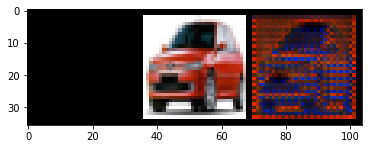

Training - Epoch 31
overall - overall_loss = 0.36854061484336853
generator - g_loss = 0.03816400468349457
classifier - c_loss = 0.3303765058517456 acc = 0.884


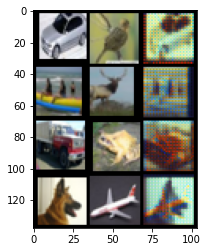

Testing - Epoch 31
overall - overall_loss = 0.48090410232543945
generator - g_loss = 0.035335227847099304
classifier - c_loss = 0.4455689787864685 acc = 0.8585
Save best checkpoint with overall loss 0.48090410232543945 - g_loss 0.035335227847099304 - c_loss 0.4455689787864685


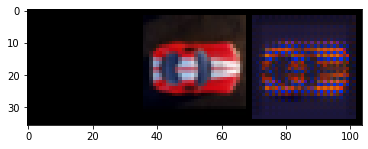

Training - Epoch 32
overall - overall_loss = 0.3559107184410095
generator - g_loss = 0.03803813457489014
classifier - c_loss = 0.3178725838661194 acc = 0.88988


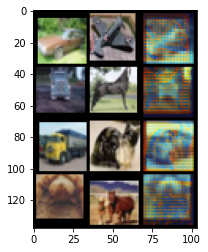

Testing - Epoch 32
overall - overall_loss = 0.5528734922409058
generator - g_loss = 0.04418966919183731
classifier - c_loss = 0.5086839199066162 acc = 0.8403


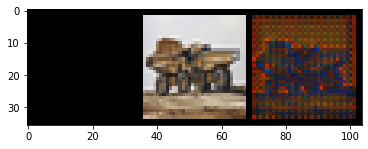

Training - Epoch 33
overall - overall_loss = 0.3471207022666931
generator - g_loss = 0.038328204303979874
classifier - c_loss = 0.3087926208972931 acc = 0.89168


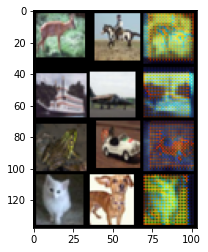

Testing - Epoch 33
overall - overall_loss = 0.48595213890075684
generator - g_loss = 0.03986184298992157
classifier - c_loss = 0.4460902810096741 acc = 0.8537


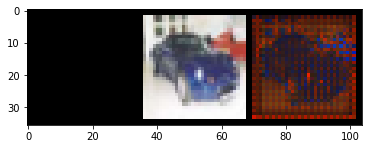

Training - Epoch 34
overall - overall_loss = 0.34364622831344604
generator - g_loss = 0.03758026659488678
classifier - c_loss = 0.30606597661972046 acc = 0.89492


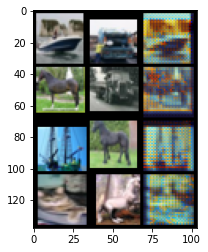

Testing - Epoch 34
overall - overall_loss = 0.5101606845855713
generator - g_loss = 0.03856436535716057
classifier - c_loss = 0.4715963304042816 acc = 0.8514


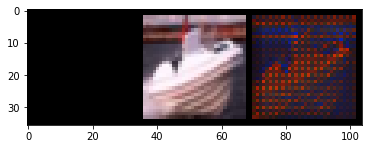

Training - Epoch 35
overall - overall_loss = 0.3355012834072113
generator - g_loss = 0.03766782581806183
classifier - c_loss = 0.2978334426879883 acc = 0.896


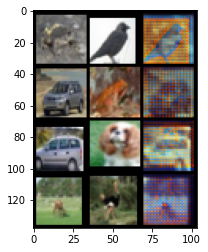

Testing - Epoch 35
overall - overall_loss = 0.4871028661727905
generator - g_loss = 0.040002115070819855
classifier - c_loss = 0.4471007287502289 acc = 0.8535


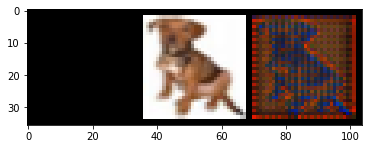

Training - Epoch 36
overall - overall_loss = 0.3251799941062927
generator - g_loss = 0.03877613693475723
classifier - c_loss = 0.28640395402908325 acc = 0.89856


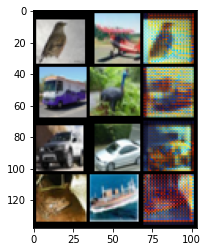

Testing - Epoch 36
overall - overall_loss = 0.627453088760376
generator - g_loss = 0.03982299566268921
classifier - c_loss = 0.5876300930976868 acc = 0.811


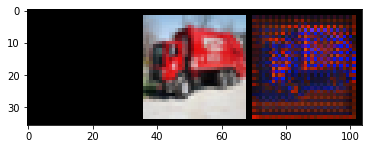

Training - Epoch 37
overall - overall_loss = 0.3265194892883301
generator - g_loss = 0.03846295177936554
classifier - c_loss = 0.2880565822124481 acc = 0.89876


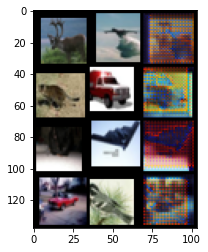

Testing - Epoch 37
overall - overall_loss = 0.5672165155410767
generator - g_loss = 0.047933731228113174
classifier - c_loss = 0.519282877445221 acc = 0.8377


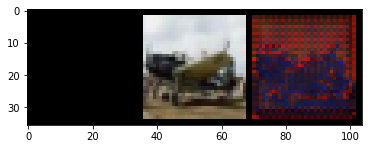

Training - Epoch 38
overall - overall_loss = 0.30969300866127014
generator - g_loss = 0.0386260449886322
classifier - c_loss = 0.27106693387031555 acc = 0.90348


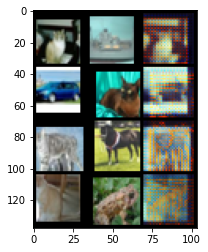

Testing - Epoch 38
overall - overall_loss = 0.5206082463264465
generator - g_loss = 0.025034837424755096
classifier - c_loss = 0.49557337164878845 acc = 0.8476


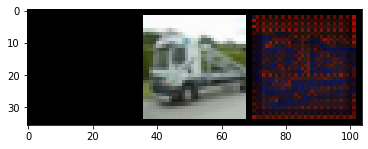

Training - Epoch 39
overall - overall_loss = 0.30384039878845215
generator - g_loss = 0.03740778565406799
classifier - c_loss = 0.26643267273902893 acc = 0.90696


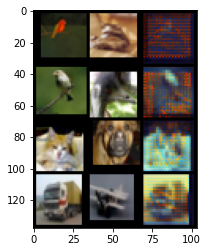

Testing - Epoch 39
overall - overall_loss = 0.5671910047531128
generator - g_loss = 0.029912108555436134
classifier - c_loss = 0.5372788310050964 acc = 0.8424


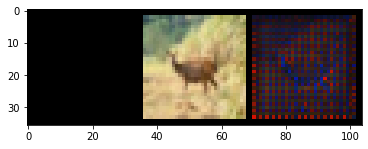

Training - Epoch 40
overall - overall_loss = 0.3052232563495636
generator - g_loss = 0.03834198787808418
classifier - c_loss = 0.26688116788864136 acc = 0.906


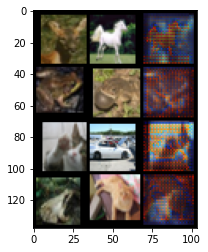

Testing - Epoch 40
overall - overall_loss = 0.6110917925834656
generator - g_loss = 0.014286689460277557
classifier - c_loss = 0.5968050956726074 acc = 0.8199


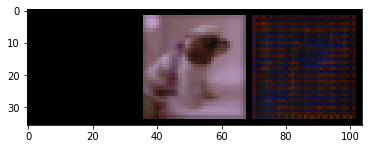

Training - Epoch 41
overall - overall_loss = 0.29501476883888245
generator - g_loss = 0.0376632884144783
classifier - c_loss = 0.25735142827033997 acc = 0.9118


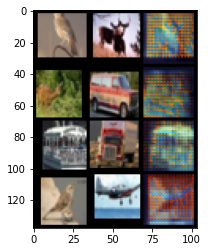

Testing - Epoch 41
overall - overall_loss = 0.5978298783302307
generator - g_loss = 0.020461784675717354
classifier - c_loss = 0.5773681998252869 acc = 0.8236


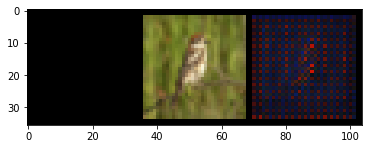

Training - Epoch 42
overall - overall_loss = 0.2961537539958954
generator - g_loss = 0.03777214512228966
classifier - c_loss = 0.2583816945552826 acc = 0.90936


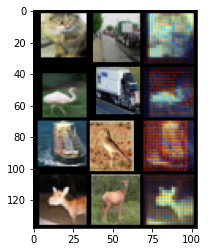

Testing - Epoch 42
overall - overall_loss = 0.485313355922699
generator - g_loss = 0.037574268877506256
classifier - c_loss = 0.44773900508880615 acc = 0.862


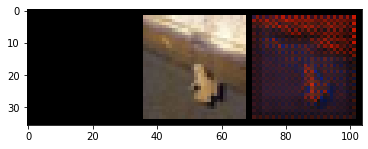

Training - Epoch 43
overall - overall_loss = 0.29376673698425293
generator - g_loss = 0.03853657469153404
classifier - c_loss = 0.2552298605442047 acc = 0.91056


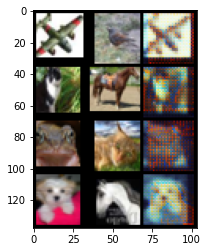

Testing - Epoch 43
overall - overall_loss = 0.5661443471908569
generator - g_loss = 0.03621625155210495
classifier - c_loss = 0.5299280881881714 acc = 0.8436


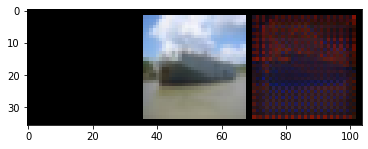

Training - Epoch 44
overall - overall_loss = 0.2793309986591339
generator - g_loss = 0.0373736247420311
classifier - c_loss = 0.24195727705955505 acc = 0.91624


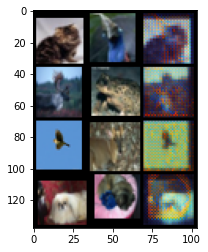

Testing - Epoch 44
overall - overall_loss = 0.5549253821372986
generator - g_loss = 0.03181940317153931
classifier - c_loss = 0.523106038570404 acc = 0.8457


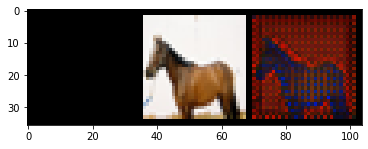

Training - Epoch 45
overall - overall_loss = 0.2765398621559143
generator - g_loss = 0.03801294416189194
classifier - c_loss = 0.23852697014808655 acc = 0.91532


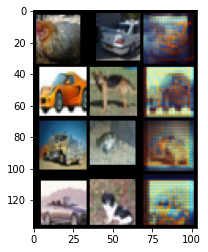

Testing - Epoch 45
overall - overall_loss = 0.5222744345664978
generator - g_loss = 0.03775353357195854
classifier - c_loss = 0.4845207929611206 acc = 0.8563


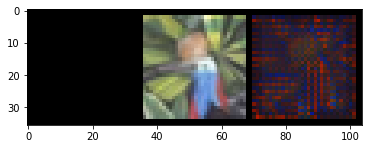

Training - Epoch 46
overall - overall_loss = 0.2690788805484772
generator - g_loss = 0.03744770586490631
classifier - c_loss = 0.2316313087940216 acc = 0.91808


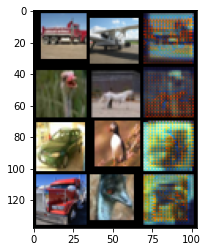

Testing - Epoch 46
overall - overall_loss = 0.5016112923622131
generator - g_loss = 0.02498948760330677
classifier - c_loss = 0.4766217768192291 acc = 0.8536


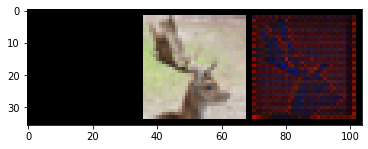

Training - Epoch 47
overall - overall_loss = 0.2620711326599121
generator - g_loss = 0.03688143566250801
classifier - c_loss = 0.22518977522850037 acc = 0.92028


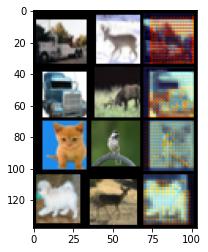

Testing - Epoch 47
overall - overall_loss = 0.5004340410232544
generator - g_loss = 0.04725480452179909
classifier - c_loss = 0.4531792402267456 acc = 0.8692


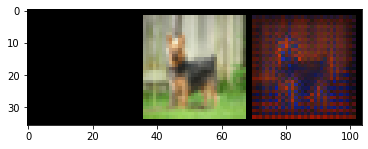

Training - Epoch 48
overall - overall_loss = 0.26333650946617126
generator - g_loss = 0.03861069679260254
classifier - c_loss = 0.22472572326660156 acc = 0.92196


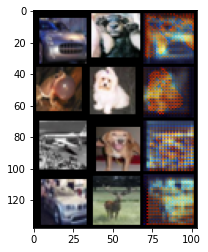

Testing - Epoch 48
overall - overall_loss = 0.5158517956733704
generator - g_loss = 0.0226711668074131
classifier - c_loss = 0.4931807518005371 acc = 0.8555


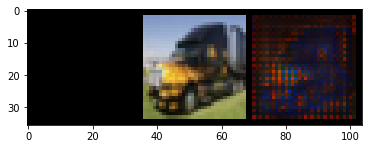

Training - Epoch 49
overall - overall_loss = 0.2543799877166748
generator - g_loss = 0.038408271968364716
classifier - c_loss = 0.21597164869308472 acc = 0.92612


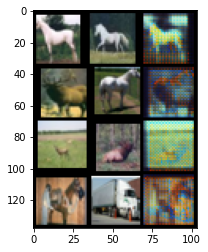

Testing - Epoch 49
overall - overall_loss = 0.492064893245697
generator - g_loss = 0.03164757788181305
classifier - c_loss = 0.46041733026504517 acc = 0.8627


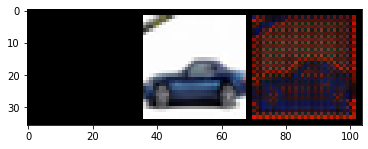

Training - Epoch 50
overall - overall_loss = 0.25424444675445557
generator - g_loss = 0.038852836936712265
classifier - c_loss = 0.21539171040058136 acc = 0.92528


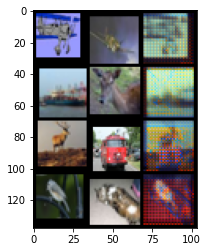

Testing - Epoch 50
overall - overall_loss = 0.5074471831321716
generator - g_loss = 0.028244685381650925
classifier - c_loss = 0.479202538728714 acc = 0.8625


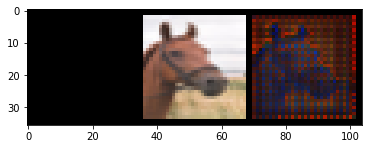

Training - Epoch 51
overall - overall_loss = 0.24447298049926758
generator - g_loss = 0.03701470047235489
classifier - c_loss = 0.2074582725763321 acc = 0.92752


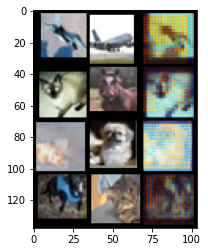

Testing - Epoch 51
overall - overall_loss = 0.4891977906227112
generator - g_loss = 0.018962716683745384
classifier - c_loss = 0.470235139131546 acc = 0.8648


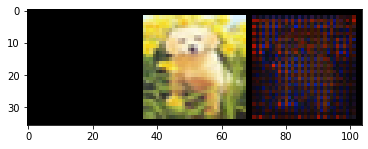

Training - Epoch 52
overall - overall_loss = 0.24233373999595642
generator - g_loss = 0.03804752603173256
classifier - c_loss = 0.20428620278835297 acc = 0.92696


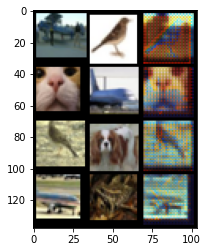

Testing - Epoch 52
overall - overall_loss = 0.495261549949646
generator - g_loss = 0.04668762534856796
classifier - c_loss = 0.4485740065574646 acc = 0.8685


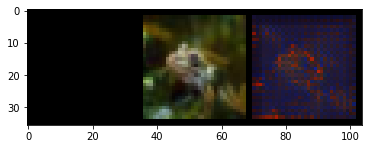

Training - Epoch 53
overall - overall_loss = 0.2372065782546997
generator - g_loss = 0.03883801028132439
classifier - c_loss = 0.19836880266666412 acc = 0.92956


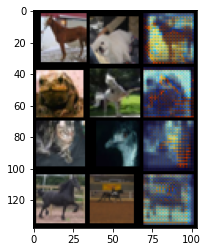

Testing - Epoch 53
overall - overall_loss = 0.573491096496582
generator - g_loss = 0.04210660979151726
classifier - c_loss = 0.5313845276832581 acc = 0.852


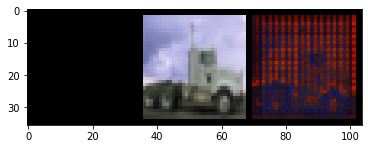

Training - Epoch 54
overall - overall_loss = 0.2311486303806305
generator - g_loss = 0.037516456097364426
classifier - c_loss = 0.19363215565681458 acc = 0.9336


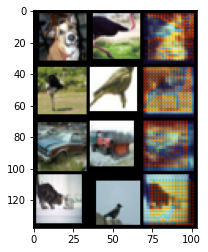

Testing - Epoch 54
overall - overall_loss = 0.5166928172111511
generator - g_loss = 0.04716164991259575
classifier - c_loss = 0.46953117847442627 acc = 0.8626


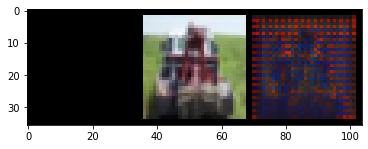

Training - Epoch 55
overall - overall_loss = 0.23093025386333466
generator - g_loss = 0.03784453123807907
classifier - c_loss = 0.19308558106422424 acc = 0.93144


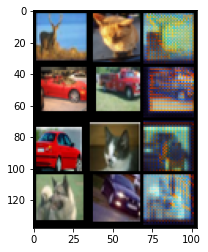

Testing - Epoch 55
overall - overall_loss = 0.5615295171737671
generator - g_loss = 0.04909839108586311
classifier - c_loss = 0.512431263923645 acc = 0.8613


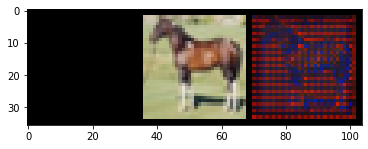

Training - Epoch 56
overall - overall_loss = 0.23631255328655243
generator - g_loss = 0.03902340307831764
classifier - c_loss = 0.19728919863700867 acc = 0.93112


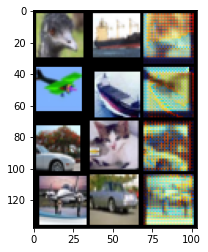

Testing - Epoch 56
overall - overall_loss = 0.5261268615722656
generator - g_loss = 0.028723986819386482
classifier - c_loss = 0.4974031150341034 acc = 0.8566


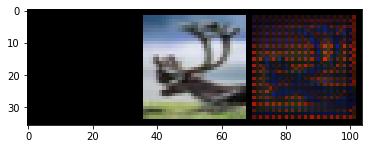

Training - Epoch 57
overall - overall_loss = 0.2307715117931366
generator - g_loss = 0.038149960339069366
classifier - c_loss = 0.19262143969535828 acc = 0.93428


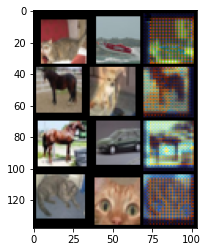

Testing - Epoch 57
overall - overall_loss = 0.5241544842720032
generator - g_loss = 0.03168502822518349
classifier - c_loss = 0.49246957898139954 acc = 0.8585


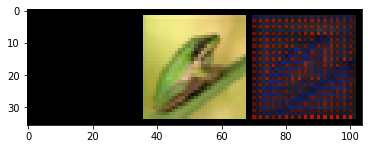

Training - Epoch 58
overall - overall_loss = 0.22022034227848053
generator - g_loss = 0.03699646145105362
classifier - c_loss = 0.18322385847568512 acc = 0.93536


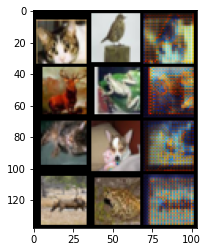

Testing - Epoch 58
overall - overall_loss = 0.5519358515739441
generator - g_loss = 0.030248986557126045
classifier - c_loss = 0.5216869115829468 acc = 0.858


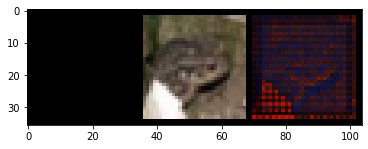

Training - Epoch 59
overall - overall_loss = 0.2172188013792038
generator - g_loss = 0.03787731006741524
classifier - c_loss = 0.1793413609266281 acc = 0.937


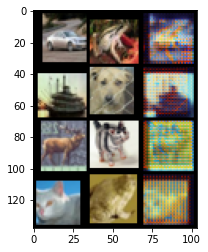

Testing - Epoch 59
overall - overall_loss = 0.5083544850349426
generator - g_loss = 0.0254893209785223
classifier - c_loss = 0.4828651249408722 acc = 0.8634


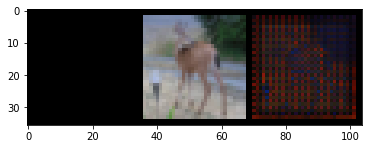

Training - Epoch 60
overall - overall_loss = 0.21450689435005188
generator - g_loss = 0.03760905563831329
classifier - c_loss = 0.17689768970012665 acc = 0.93812


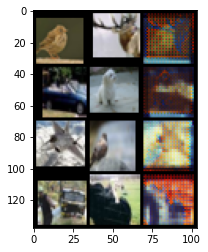

Testing - Epoch 60
overall - overall_loss = 0.5865037441253662
generator - g_loss = 0.02830396592617035
classifier - c_loss = 0.5581998825073242 acc = 0.8534


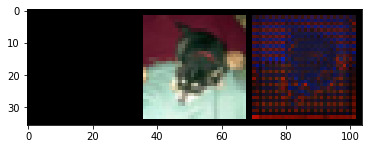

Training - Epoch 61
overall - overall_loss = 0.20806190371513367
generator - g_loss = 0.036341696977615356
classifier - c_loss = 0.1717202514410019 acc = 0.93912


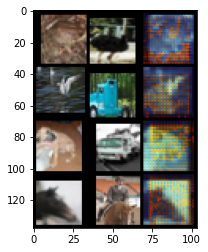

Testing - Epoch 61
overall - overall_loss = 0.4827817380428314
generator - g_loss = 0.026432402431964874
classifier - c_loss = 0.45634925365448 acc = 0.8703


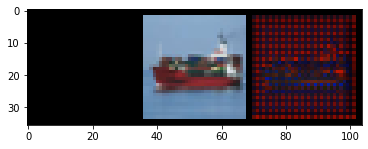

Training - Epoch 62
overall - overall_loss = 0.21447189152240753
generator - g_loss = 0.03780357912182808
classifier - c_loss = 0.17666827142238617 acc = 0.94012


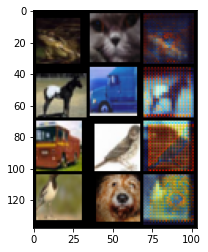

Testing - Epoch 62
overall - overall_loss = 0.5041288733482361
generator - g_loss = 0.03325117379426956
classifier - c_loss = 0.47087767720222473 acc = 0.8658


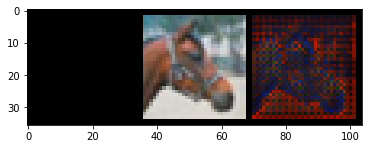

Training - Epoch 63
overall - overall_loss = 0.21063068509101868
generator - g_loss = 0.03780340775847435
classifier - c_loss = 0.17282722890377045 acc = 0.941


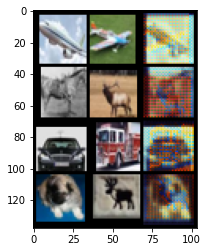

Testing - Epoch 63
overall - overall_loss = 0.5265288949012756
generator - g_loss = 0.04026227444410324
classifier - c_loss = 0.4862665832042694 acc = 0.8713


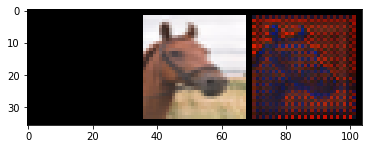

Training - Epoch 64
overall - overall_loss = 0.20527100563049316
generator - g_loss = 0.03806699439883232
classifier - c_loss = 0.16720394790172577 acc = 0.94028


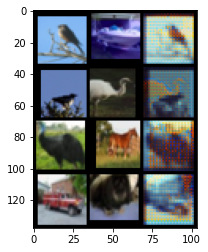

Testing - Epoch 64
overall - overall_loss = 0.48339125514030457
generator - g_loss = 0.027820101007819176
classifier - c_loss = 0.45557117462158203 acc = 0.8737


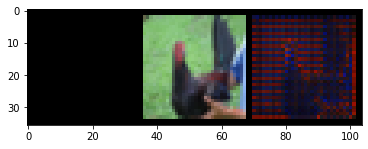

Training - Epoch 65
overall - overall_loss = 0.20002175867557526
generator - g_loss = 0.038011062890291214
classifier - c_loss = 0.1620105654001236 acc = 0.94212


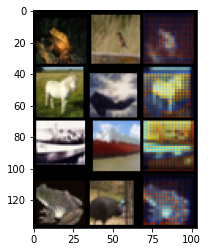

Testing - Epoch 65
overall - overall_loss = 0.5264393091201782
generator - g_loss = 0.02999100834131241
classifier - c_loss = 0.4964483678340912 acc = 0.8641


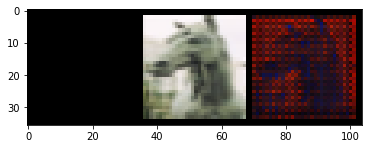

Training - Epoch 66
overall - overall_loss = 0.19655576348304749
generator - g_loss = 0.036944810301065445
classifier - c_loss = 0.15961101651191711 acc = 0.94404


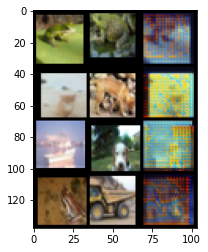

Testing - Epoch 66
overall - overall_loss = 0.6261711716651917
generator - g_loss = 0.03368138521909714
classifier - c_loss = 0.5924898386001587 acc = 0.8488


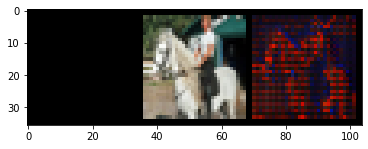

Training - Epoch 67
overall - overall_loss = 0.19335034489631653
generator - g_loss = 0.037575963884592056
classifier - c_loss = 0.15577432513237 acc = 0.9446


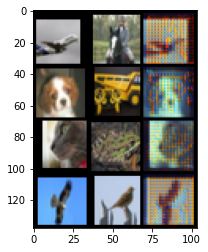

Testing - Epoch 67
overall - overall_loss = 0.6614299416542053
generator - g_loss = 0.028821995481848717
classifier - c_loss = 0.6326079964637756 acc = 0.8475


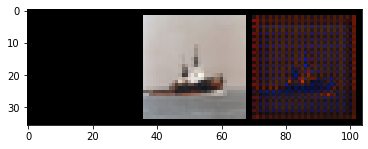

Training - Epoch 68
overall - overall_loss = 0.19714371860027313
generator - g_loss = 0.03806532174348831
classifier - c_loss = 0.15907827019691467 acc = 0.94444


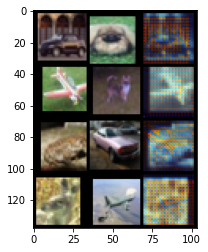

Testing - Epoch 68
overall - overall_loss = 0.5220367908477783
generator - g_loss = 0.02923496626317501
classifier - c_loss = 0.4928017854690552 acc = 0.8636


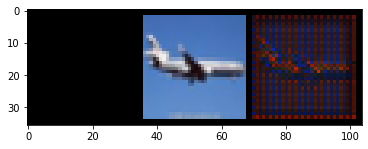

Training - Epoch 69
overall - overall_loss = 0.1937755048274994
generator - g_loss = 0.03879096359014511
classifier - c_loss = 0.15498456358909607 acc = 0.94416


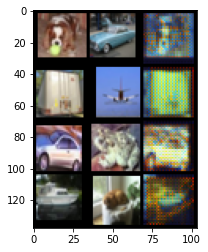

Testing - Epoch 69
overall - overall_loss = 0.6654921174049377
generator - g_loss = 0.021840086206793785
classifier - c_loss = 0.6436519622802734 acc = 0.8444


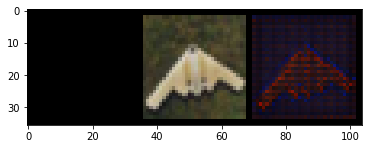

Training - Epoch 70
overall - overall_loss = 0.18823091685771942
generator - g_loss = 0.03795206546783447
classifier - c_loss = 0.15027880668640137 acc = 0.94732


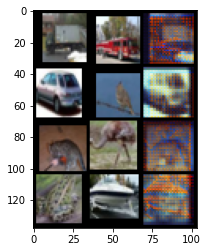

Testing - Epoch 70
overall - overall_loss = 0.5033698678016663
generator - g_loss = 0.02962506376206875
classifier - c_loss = 0.47374480962753296 acc = 0.8749


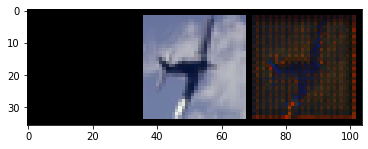

Training - Epoch 71
overall - overall_loss = 0.18481583893299103
generator - g_loss = 0.03771858289837837
classifier - c_loss = 0.1470971703529358 acc = 0.95008


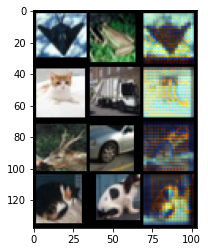

Testing - Epoch 71
overall - overall_loss = 0.504597008228302
generator - g_loss = 0.021205514669418335
classifier - c_loss = 0.48339149355888367 acc = 0.8708


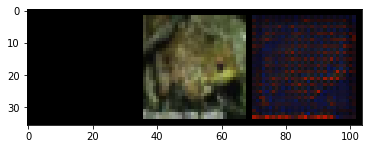

Training - Epoch 72
overall - overall_loss = 0.1878080815076828
generator - g_loss = 0.03731605410575867
classifier - c_loss = 0.1504921019077301 acc = 0.9488


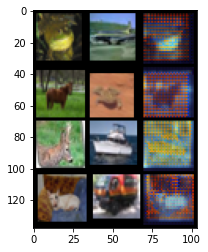

Testing - Epoch 72
overall - overall_loss = 0.5026524066925049
generator - g_loss = 0.02908972091972828
classifier - c_loss = 0.47356268763542175 acc = 0.8743


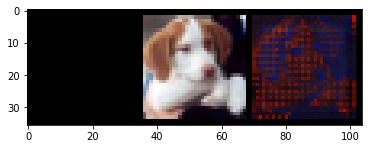

Training - Epoch 73
overall - overall_loss = 0.18650813400745392
generator - g_loss = 0.03780290111899376
classifier - c_loss = 0.1487051397562027 acc = 0.94844


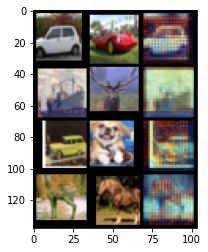

Testing - Epoch 73
overall - overall_loss = 0.6490229964256287
generator - g_loss = 0.024655085057020187
classifier - c_loss = 0.6243679523468018 acc = 0.8393


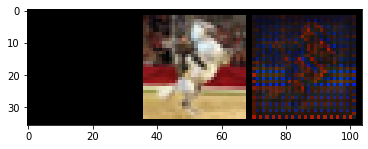

Training - Epoch 74
overall - overall_loss = 0.176164448261261
generator - g_loss = 0.0364961102604866
classifier - c_loss = 0.1396683156490326 acc = 0.95004


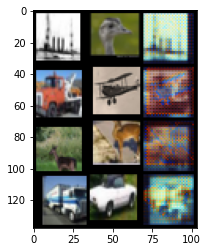

Testing - Epoch 74
overall - overall_loss = 0.647892415523529
generator - g_loss = 0.024407299235463142
classifier - c_loss = 0.6234851479530334 acc = 0.8436


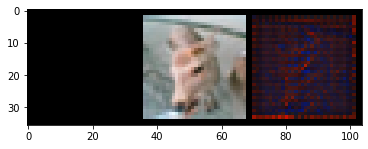

Training - Epoch 75
overall - overall_loss = 0.1719069927930832
generator - g_loss = 0.03591739013791084
classifier - c_loss = 0.13598968088626862 acc = 0.95116


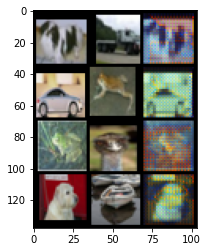

Testing - Epoch 75
overall - overall_loss = 0.5336737632751465
generator - g_loss = 0.018913637846708298
classifier - c_loss = 0.5147600769996643 acc = 0.8745


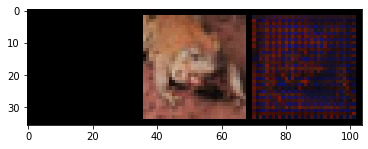

Training - Epoch 76
overall - overall_loss = 0.1732950508594513
generator - g_loss = 0.03724101930856705
classifier - c_loss = 0.1360539197921753 acc = 0.95356


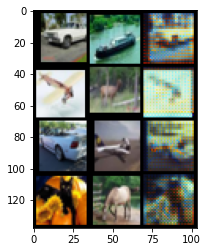

Testing - Epoch 76
overall - overall_loss = 0.5614235401153564
generator - g_loss = 0.038866251707077026
classifier - c_loss = 0.5225573182106018 acc = 0.8744


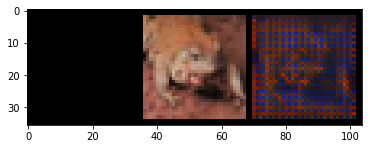

Training - Epoch 77
overall - overall_loss = 0.1816144734621048
generator - g_loss = 0.03815297409892082
classifier - c_loss = 0.14346154034137726 acc = 0.95032


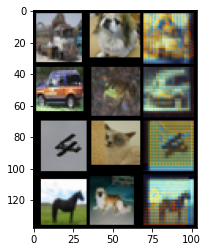

Testing - Epoch 77
overall - overall_loss = 0.5746310353279114
generator - g_loss = 0.04665717855095863
classifier - c_loss = 0.5279739499092102 acc = 0.8657


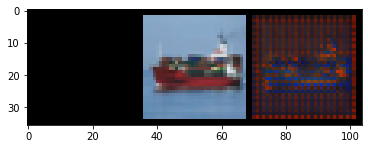

Training - Epoch 78
overall - overall_loss = 0.17136096954345703
generator - g_loss = 0.03681180253624916
classifier - c_loss = 0.13454917073249817 acc = 0.95492


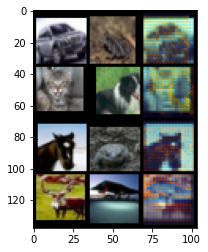

Testing - Epoch 78
overall - overall_loss = 0.6132274270057678
generator - g_loss = 0.03140110895037651
classifier - c_loss = 0.5818260908126831 acc = 0.8597


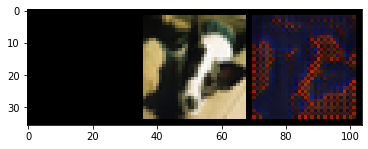

Training - Epoch 79
overall - overall_loss = 0.1699644923210144
generator - g_loss = 0.03834490105509758
classifier - c_loss = 0.13161957263946533 acc = 0.95312


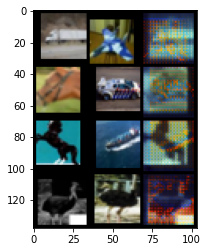

Testing - Epoch 79
overall - overall_loss = 0.574259877204895
generator - g_loss = 0.02953428588807583
classifier - c_loss = 0.5447257161140442 acc = 0.8668


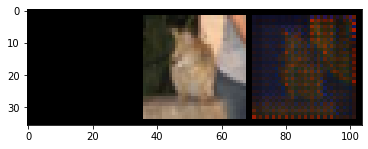

Training - Epoch 80
overall - overall_loss = 0.16950169205665588
generator - g_loss = 0.03808530792593956
classifier - c_loss = 0.13141633570194244 acc = 0.95228


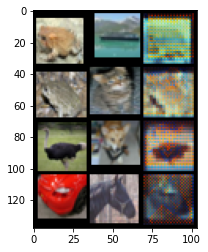

Testing - Epoch 80
overall - overall_loss = 0.6400585770606995
generator - g_loss = 0.03315694257616997
classifier - c_loss = 0.6069015264511108 acc = 0.8536


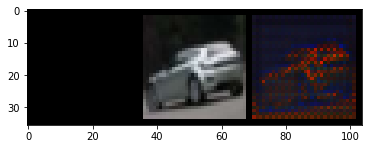

Training - Epoch 81
overall - overall_loss = 0.1619986742734909
generator - g_loss = 0.03764888271689415
classifier - c_loss = 0.12434966117143631 acc = 0.9564


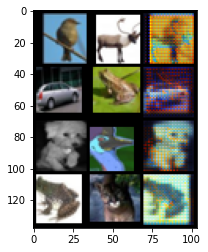

Testing - Epoch 81
overall - overall_loss = 0.5404255390167236
generator - g_loss = 0.027636196464300156
classifier - c_loss = 0.5127893686294556 acc = 0.8737


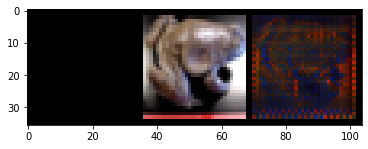

Training - Epoch 82
overall - overall_loss = 0.16797320544719696
generator - g_loss = 0.03788890317082405
classifier - c_loss = 0.1300843358039856 acc = 0.954


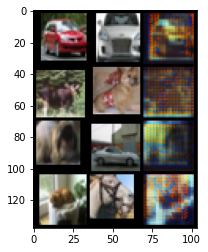

Testing - Epoch 82
overall - overall_loss = 0.5996158123016357
generator - g_loss = 0.04588235542178154
classifier - c_loss = 0.553733229637146 acc = 0.8685


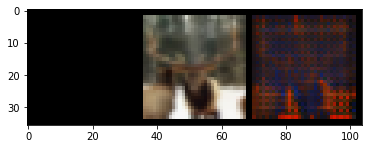

Training - Epoch 83
overall - overall_loss = 0.166671484708786
generator - g_loss = 0.03772803023457527
classifier - c_loss = 0.1289432942867279 acc = 0.9558


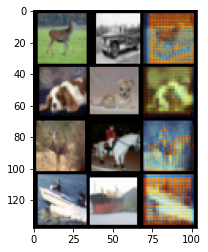

Testing - Epoch 83
overall - overall_loss = 0.6256684064865112
generator - g_loss = 0.021131310611963272
classifier - c_loss = 0.6045370697975159 acc = 0.8557


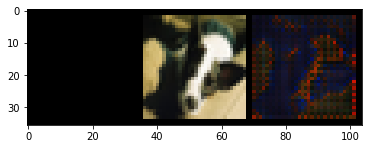

Training - Epoch 84
overall - overall_loss = 0.16170108318328857
generator - g_loss = 0.036511946469545364
classifier - c_loss = 0.12518911063671112 acc = 0.95736


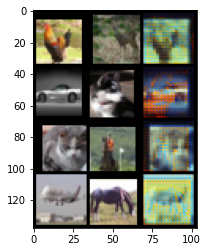

Testing - Epoch 84
overall - overall_loss = 0.5714612007141113
generator - g_loss = 0.044231925159692764
classifier - c_loss = 0.5272292494773865 acc = 0.8723


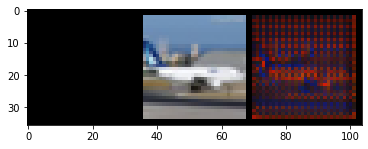

Training - Epoch 85
overall - overall_loss = 0.16138026118278503
generator - g_loss = 0.03877393528819084
classifier - c_loss = 0.12260635197162628 acc = 0.95672


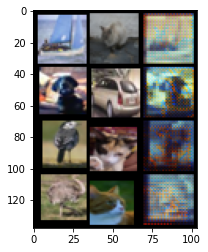

Testing - Epoch 85
overall - overall_loss = 0.7948243021965027
generator - g_loss = 0.03450215235352516
classifier - c_loss = 0.7603221535682678 acc = 0.8401


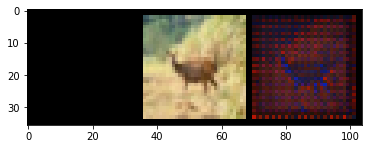

Training - Epoch 86
overall - overall_loss = 0.16183842718601227
generator - g_loss = 0.03728242591023445
classifier - c_loss = 0.12455593794584274 acc = 0.95744


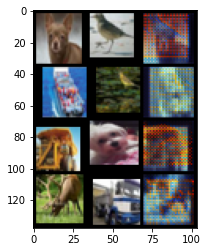

Testing - Epoch 86
overall - overall_loss = 0.5542362928390503
generator - g_loss = 0.03687385469675064
classifier - c_loss = 0.5173625349998474 acc = 0.8689


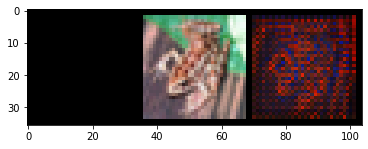

Training - Epoch 87
overall - overall_loss = 0.1595732420682907
generator - g_loss = 0.037251729518175125
classifier - c_loss = 0.12232154607772827 acc = 0.95612


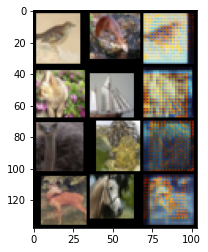

Testing - Epoch 87
overall - overall_loss = 0.608528733253479
generator - g_loss = 0.033203281462192535
classifier - c_loss = 0.5753255486488342 acc = 0.8586


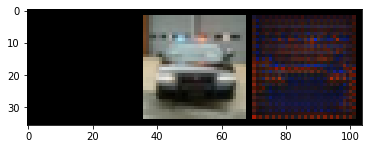

Training - Epoch 88
overall - overall_loss = 0.15508925914764404
generator - g_loss = 0.03628313168883324
classifier - c_loss = 0.11880612373352051 acc = 0.9588


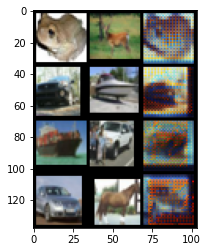

Testing - Epoch 88
overall - overall_loss = 0.6142611503601074
generator - g_loss = 0.033976681530475616
classifier - c_loss = 0.5802845358848572 acc = 0.8638


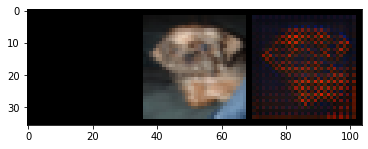

Training - Epoch 89
overall - overall_loss = 0.15208391845226288
generator - g_loss = 0.0366017185151577
classifier - c_loss = 0.11548220366239548 acc = 0.95952


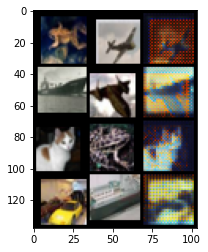

Testing - Epoch 89
overall - overall_loss = 0.5654664635658264
generator - g_loss = 0.030640754848718643
classifier - c_loss = 0.5348258018493652 acc = 0.8722


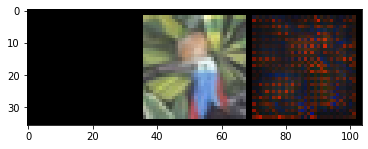

Training - Epoch 90
overall - overall_loss = 0.1535307765007019
generator - g_loss = 0.03753949701786041
classifier - c_loss = 0.11599122732877731 acc = 0.95964


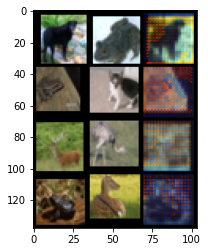

Testing - Epoch 90
overall - overall_loss = 0.5639132857322693
generator - g_loss = 0.030410775914788246
classifier - c_loss = 0.5335025191307068 acc = 0.8724


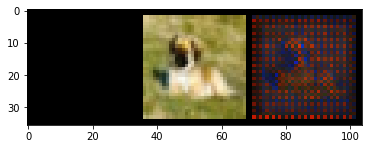

Training - Epoch 91
overall - overall_loss = 0.1571618616580963
generator - g_loss = 0.03768262267112732
classifier - c_loss = 0.11947919428348541 acc = 0.958


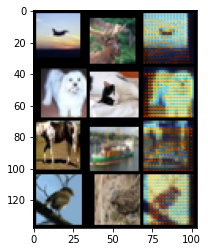

Testing - Epoch 91
overall - overall_loss = 0.5484145283699036
generator - g_loss = 0.03353924676775932
classifier - c_loss = 0.5148754715919495 acc = 0.8751


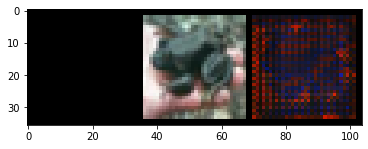

Training - Epoch 92
overall - overall_loss = 0.14769813418388367
generator - g_loss = 0.03573770821094513
classifier - c_loss = 0.11196045577526093 acc = 0.96108


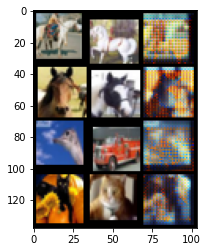

Testing - Epoch 92
overall - overall_loss = 0.7069190144538879
generator - g_loss = 0.027632100507616997
classifier - c_loss = 0.6792868375778198 acc = 0.8488


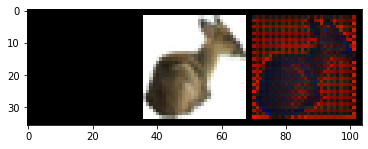

Training - Epoch 93
overall - overall_loss = 0.15349990129470825
generator - g_loss = 0.03796521946787834
classifier - c_loss = 0.11553467810153961 acc = 0.9608


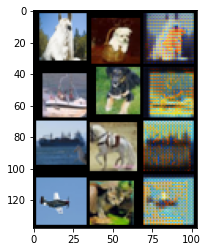

Testing - Epoch 93
overall - overall_loss = 0.5301889777183533
generator - g_loss = 0.024051565676927567
classifier - c_loss = 0.5061373114585876 acc = 0.8777


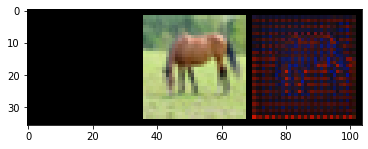

Training - Epoch 94
overall - overall_loss = 0.15790782868862152
generator - g_loss = 0.038438186049461365
classifier - c_loss = 0.11946965754032135 acc = 0.95892


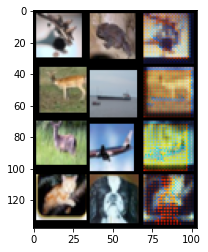

Testing - Epoch 94
overall - overall_loss = 0.5508137345314026
generator - g_loss = 0.02275962196290493
classifier - c_loss = 0.5280540585517883 acc = 0.8727


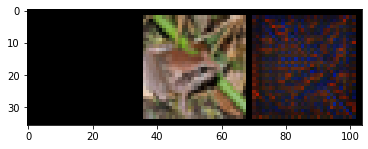

Training - Epoch 95
overall - overall_loss = 0.15013466775417328
generator - g_loss = 0.037483733147382736
classifier - c_loss = 0.1126510351896286 acc = 0.96072


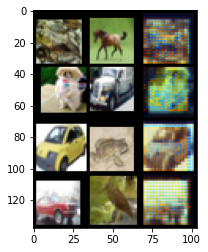

Testing - Epoch 95
overall - overall_loss = 0.5533061623573303
generator - g_loss = 0.022961799055337906
classifier - c_loss = 0.5303443670272827 acc = 0.8738


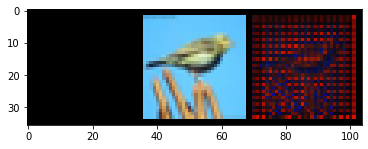

Training - Epoch 96
overall - overall_loss = 0.1525905281305313
generator - g_loss = 0.0383257232606411
classifier - c_loss = 0.11426480859518051 acc = 0.96072


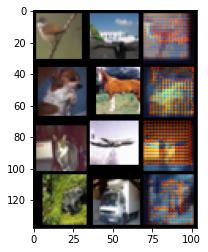

Testing - Epoch 96
overall - overall_loss = 0.5387877821922302
generator - g_loss = 0.042019717395305634
classifier - c_loss = 0.49676811695098877 acc = 0.8788


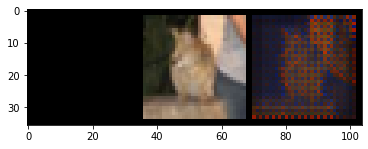

Training - Epoch 97
overall - overall_loss = 0.14124751091003418
generator - g_loss = 0.03628719598054886
classifier - c_loss = 0.10496033728122711 acc = 0.964


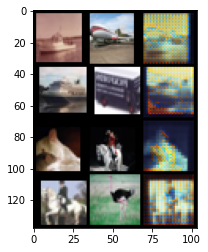

Testing - Epoch 97
overall - overall_loss = 0.5502563714981079
generator - g_loss = 0.019934866577386856
classifier - c_loss = 0.530321478843689 acc = 0.8747


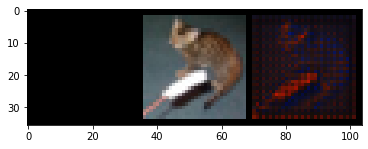

Training - Epoch 98
overall - overall_loss = 0.13582171499729156
generator - g_loss = 0.036306027323007584
classifier - c_loss = 0.09951566159725189 acc = 0.96496


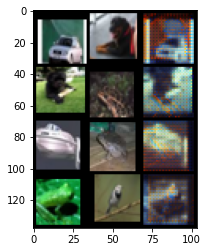

Testing - Epoch 98
overall - overall_loss = 0.9137647151947021
generator - g_loss = 0.036582931876182556
classifier - c_loss = 0.877181887626648 acc = 0.8291


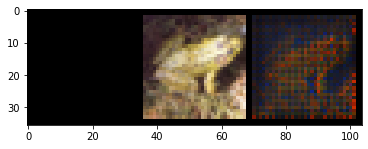

Training - Epoch 99
overall - overall_loss = 0.14725229144096375
generator - g_loss = 0.03695452958345413
classifier - c_loss = 0.11029770970344543 acc = 0.96136


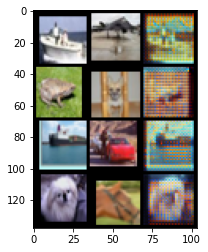

Testing - Epoch 99
overall - overall_loss = 0.7521783113479614
generator - g_loss = 0.08863858878612518
classifier - c_loss = 0.6635395288467407 acc = 0.845


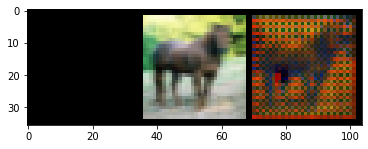

In [30]:
for epoch in range(100):
    train_end2end(train_loader, epoch, generator, classifier, mse_criterion, ce_criterion, cuda=True, show=True)
    test_end2end(test_loader, generator, classifier, ce_criterion, cuda=True, show=True)